In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

Solve the system ODEs:

In [2]:
tmin = 0.0 #start time.
tmax = 5.0 #end time.
N = 1001 #number of point between tmin and tmax including endpoints.
dt = (tmax - tmin)/(N - 1)
t_line = np.linspace(tmin, tmax, N)

In [3]:
MyEps = 10**-16 #Tolerance in billiard wall fuzziness.

In [4]:
# Coods of walls:
RightWall_x = 1.0
LeftWall_x = -1.0

TopWall_y = 1.0
BottomWall_y = -1.0

In [5]:
%%time
# IC:
x = -0.5
y = -0.1
x_old = x
y_old = y

vx = 1.0
vy = 0.7
#-----
sol = [] #This is where [x, y, vx, vy] will be saved at each time step.

print("i\tt\tx\ty\tvx\tvy\tbounce")
print("-\t-\t-\t-\t--\t--\t------")

for ii, t in enumerate(t_line):
    sol.append([x, y, vx, vy])
    
    dx = vx*dt
    dy = vy*dt
    
    # Top wall bounce:
    if (y_old<TopWall_y) and (y>TopWall_y):
        print("{}\t{:.2f}\t{:.2f}\t{:.2f}\t{:.2f}\t{:.2f}\tbounce top".format(ii, t, x, y, vx, vy))
        dvx = 0.
        dvy = -2*vy
    # Bottom wall bounce:
    elif (y_old>BottomWall_y) and (y<BottomWall_y):
        print("{}\t{:.2f}\t{:.2f}\t{:.2f}\t{:.2f}\t{:.2f}\tbounce bottom".format(ii, t, x, y, vx, vy))
        dvx = 0.
        dvy = -2*vy
    # Left wall bounce:
    elif (x_old-LeftWall_x>MyEps) and (x-LeftWall_x<MyEps):
        print("{}\t{:.2f}\t{:.2f}\t{:.2f}\t{:.2f}\t{:.2f}\tbounce left".format(ii, t, x, y, vx, vy))
        dvx = -2*vx
        dvy = 0.0
    # Right wall bounce:
    elif (x_old-RightWall_x<MyEps) and (x-RightWall_x)>MyEps:
        print("{}\t{:.2f}\t{:.2f}\t{:.2f}\t{:.2f}\t{:.2f}\tbounce right".format(ii, t, x, y, vx, vy))
        dvx = -2*vx
        dvy = 0.0
    # No bounce:
    else:
        dvx = 0.0
        dvy = 0.0
    
    vx = vx + dvx
    vy = vy + dvy
    
    x_old = x
    y_old = y
    
    x = x + dx
    y = y + dy

i	t	x	y	vx	vy	bounce
-	-	-	-	--	--	------
300	1.50	1.00	0.95	1.00	0.70	bounce right
315	1.57	0.94	1.00	-1.00	0.70	bounce top
702	3.51	-1.00	-0.35	-1.00	-0.70	bounce left
890	4.45	-0.07	-1.00	1.00	-0.70	bounce bottom
CPU times: user 3.94 ms, sys: 1.25 ms, total: 5.2 ms
Wall time: 4.28 ms


In [6]:
sol = np.array(sol)

Set up the figure, axis, and the plot element we want to animate:

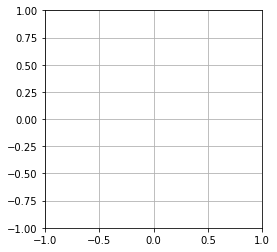

In [7]:
fig, ax = plt.subplots()

ax.set_aspect("equal")
ax.set_xlim((-1, 1))
ax.set_ylim((-1, 1))

ax.grid(True)

# Mass, string and text:
MyMass, = ax.plot([], [], "ro-", ms=10, lw=2, zorder=2)
MyText = ax.text(0, 0, '', transform=ax.transAxes)
# NOTE THE POSITION OF MyText!!!

Define the initialization function, which plots the background of each frame:

In [8]:
def init():
    MyMass.set_data([], [])
    MyText.set_text('')
    return (MyMass, MyText)

Define the animation function, which is called for each new frame:

In [9]:
def animate(i):
    x = sol[i,0]
    y = sol[i,1]
    
    xData = np.array([0, x])
    yData = np.array([0, y])
    
    MyMass.set_data(x, y)
    MyText.set_text('t={:.2f}, x={:.2f}, y={:.2f}'.format(t_line[i], x, y))
    
    return (MyMass, MyText)

Compile the animation. Setting ```blit=True``` will only redraw parts that have changed:

In [10]:
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=range(0, N),
                               interval=5,
                               blit=True, repeat=False)

In [11]:
%%time
HTML(anim.to_jshtml())

CPU times: user 51.1 s, sys: 1.11 s, total: 52.2 s
Wall time: 52.3 s
